<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Sports%20Footwear%20Sales%20%26%20Consumer%20Behavior%20Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sports Footwear Sales & Consumer Behavior

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d aliiihussain/sports-footwear-sales-and-consumer-behavior

# Unziping the downloaded file
!unzip sports-footwear-sales-and-consumer-behavior.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/aliiihussain/sports-footwear-sales-and-consumer-behavior
License(s): CC0-1.0
  0% 0.00/736k [00:00<?, ?B/s]
100% 736k/736k [00:00<00:00, 1.00GB/s]
Archive:  sports-footwear-sales-and-consumer-behavior.zip
  inflating: global_sports_footwear_sales_2018_2026.csv  


# Data Inspection

In [3]:
df = pd.read_csv('global_sports_footwear_sales_2018_2026.csv')
df.head(11)

,order_id,order_date,brand,model_name,category,gender,size,color,base_price_usd,discount_percent,final_price_usd,units_sold,revenue_usd,payment_method,sales_channel,country,customer_income_level,customer_rating
0,ORD100000,2021-01-30,ASICS,Model-370,Running,Unisex,8,Black,162,15,137.70,1,137.70,Card,Retail Store,Germany,Low,4.6
1,ORD100001,2026-10-05,Reebok,Model-314,Lifestyle,Men,8,Grey,80,5,76.00,3,228.00,Card,Online,USA,Low,3.9
2,ORD100002,2023-11-12,ASICS,Model-763,Lifestyle,Men,8,Black,176,15,149.60,4,598.40,Cash,Retail Store,India,Medium,3.0
3,ORD100003,2026-08-29,Reebok,Model-905,Basketball,Women,7,White,61,15,51.85,2,103.70,Card,Retail Store,India,High,3.4
4,ORD100004,2019-11-09,Nike,Model-413,Training,Men,11,Black,80,0,80.00,4,320.00,Cash,Online,USA,Medium,3.0
5,ORD100005,2021-08-27,Nike,Model-158,Gym,Unisex,7,Grey,148,0,148.00,3,444.00,Wallet,Retail Store,UK,Low,3.1
6,ORD100006,2019-02-21,Reebok,Model-786,Gym,Women,11,Black,74,30,51.80,2,103.60,Bank Transfer,Online,UAE,High,3.4
7,ORD100007,2020-05-17,New Balance,Model-604,Lifestyle,Women,8,White,114,15,96.90,4,387.60,Bank Transfer,Online,USA,High,4.7
8,ORD100008,2022-03-30,New Balance,Model-266,Running,Unisex,7,Grey,194,20,155.20,1,155.20,Bank Transfer,Retail Store,UK,High,4.9
9,ORD100009,2026-03-11,Nike,Model-876,Gym,Unisex,7,Black,119,30,83.30,2,166.60,Card,Retail Store,USA,Medium,3.2


In [4]:
df.tail(11)

,order_id,order_date,brand,model_name,category,gender,size,color,base_price_usd,discount_percent,final_price_usd,units_sold,revenue_usd,payment_method,sales_channel,country,customer_income_level,customer_rating
29989,ORD129989,2022-09-16,Puma,Model-668,Gym,Unisex,6,Black,136,20,108.80,4,435.20,Cash,Online,Germany,Low,3.1
29990,ORD129990,2023-10-06,Nike,Model-406,Basketball,Women,6,Black,128,30,89.60,2,179.20,Card,Online,Pakistan,Low,3.1
29991,ORD129991,2026-12-11,ASICS,Model-858,Training,Unisex,6,White,171,15,145.35,1,145.35,Cash,Retail Store,Pakistan,Medium,3.3
29992,ORD129992,2023-01-21,Nike,Model-203,Gym,Men,9,Black,147,30,102.90,2,205.80,Bank Transfer,Online,UAE,High,3.7
29993,ORD129993,2019-02-05,Reebok,Model-305,Running,Unisex,7,White,97,5,92.15,2,184.30,Cash,Retail Store,UK,Low,4.9
29994,ORD129994,2022-12-04,Reebok,Model-206,Basketball,Women,8,Red,151,20,120.80,4,483.20,Bank Transfer,Retail Store,UK,High,3.7
29995,ORD129995,2018-05-28,Puma,Model-892,Gym,Women,6,Blue,140,10,126.00,1,126.00,Card,Online,UAE,High,4.3
29996,ORD129996,2018-04-28,Adidas,Model-982,Running,Women,9,Grey,113,15,96.05,1,96.05,Card,Online,UK,High,3.5
29997,ORD129997,2026-02-17,ASICS,Model-463,Basketball,Men,11,Blue,130,30,91.00,1,91.00,Wallet,Online,India,Medium,4.4
29998,ORD129998,2024-02-21,New Balance,Model-984,Running,Unisex,11,White,186,10,167.40,2,334.80,Wallet,Retail Store,USA,High,3.9


In [5]:
df.shape

(30000, 18)

In [6]:
df.columns

Index(['order_id', 'order_date', 'brand', 'model_name', 'category', 'gender',
       'size', 'color', 'base_price_usd', 'discount_percent',
       'final_price_usd', 'units_sold', 'revenue_usd', 'payment_method',
       'sales_channel', 'country', 'customer_income_level', 'customer_rating'],
      dtype='object')

In [7]:
df.dtypes

,0
order_id,object
order_date,object
brand,object
model_name,object
category,object
gender,object
size,int64
color,object
base_price_usd,int64
discount_percent,int64


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   order_id               30000 non-null  object 
 1   order_date             30000 non-null  object 
 2   brand                  30000 non-null  object 
 3   model_name             30000 non-null  object 
 4   category               30000 non-null  object 
 5   gender                 30000 non-null  object 
 6   size                   30000 non-null  int64  
 7   color                  30000 non-null  object 
 8   base_price_usd         30000 non-null  int64  
 9   discount_percent       30000 non-null  int64  
 10  final_price_usd        30000 non-null  float64
 11  units_sold             30000 non-null  int64  
 12  revenue_usd            30000 non-null  float64
 13  payment_method         30000 non-null  object 
 14  sales_channel          30000 non-null  object 
 15  co

In [10]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
order_id,30000,30000,ORD129983,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
order_date,30000,3287,2022-09-20,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN
brand,30000,6,ASICS,5132,NaN,NaN,NaN,NaN,NaN,NaN,NaN
model_name,30000,899,Model-863,53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
category,30000,5,Basketball,6074,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,30000,3,Men,10075,NaN,NaN,NaN,NaN,NaN,NaN,NaN
size,30000.0,NaN,NaN,NaN,8.500867,1.710896,6.0,7.0,9.0,10.0,11.0
color,30000,5,Grey,6046,NaN,NaN,NaN,NaN,NaN,NaN,NaN
base_price_usd,30000.0,NaN,NaN,NaN,139.634633,46.062549,60.0,100.0,140.0,180.0,219.0
discount_percent,30000.0,NaN,NaN,NaN,13.332167,9.864198,0.0,5.0,10.0,20.0,30.0


In [11]:
df.isnull().sum()

,0
order_id,0
order_date,0
brand,0
model_name,0
category,0
gender,0
size,0
color,0
base_price_usd,0
discount_percent,0


In [12]:
df.duplicated().sum()

np.int64(0)

# Statistical Analysis

--- 1. THE BRAND WARS (ANOVA TEST) ---
Testing Price differences between: ['ASICS', 'Reebok', 'Nike', 'New Balance', 'Puma']
📉 ANOVA P-Value: 7.1447e-01
❌ RESULT: Brand Name doesn't matter (Prices are similar across brands).


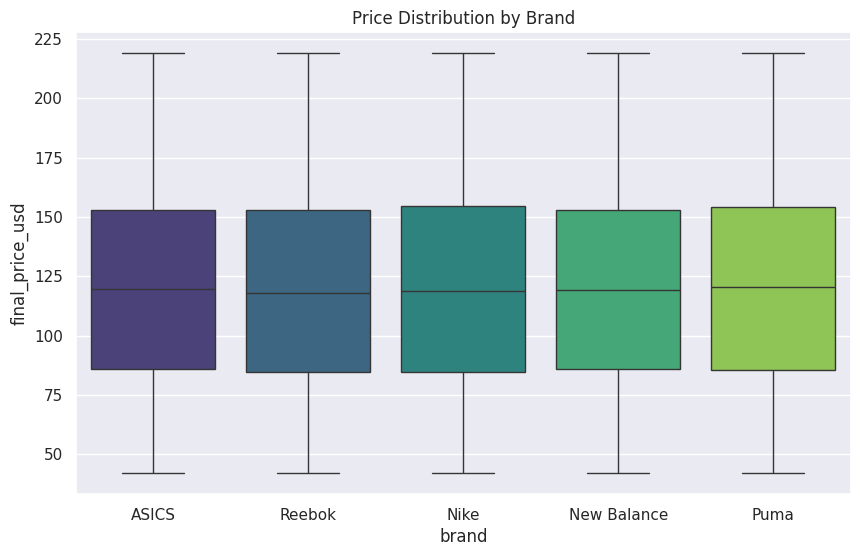


--- 2. MATERIAL VS. RATING (T-TEST) ---
⚠️ Column 'Material' not found. Skipping this test.

--- 3. CORRELATION MATRIX (WHAT DRIVES SALES?) ---


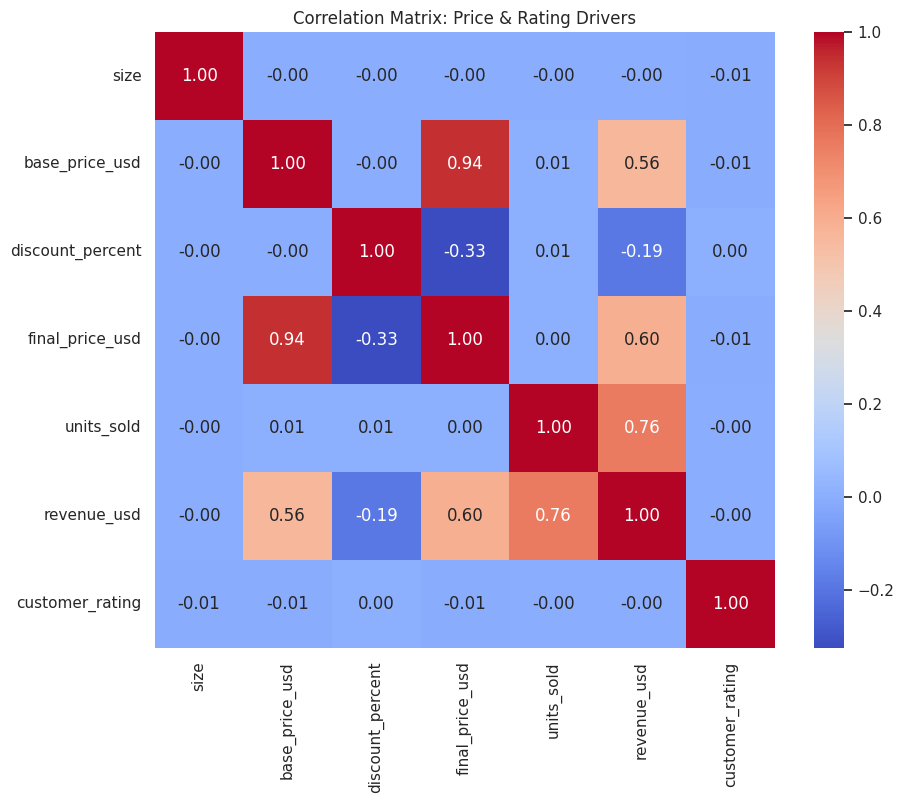

In [18]:
from scipy import stats

print("--- 1. THE BRAND WARS (ANOVA TEST) ---")
# Hypothesis: There is a significant price difference between brands (Nike vs Adidas vs Puma...)
# If P < 0.05, the Brand Name DOES matter for price.

# Get Top 5 Brands to keep it readable
top_brands = df['brand'].value_counts().head(5).index.tolist()
print(f"Testing Price differences between: {top_brands}")

# Create groups for ANOVA
brand_groups = [df[df['brand'] == b]['final_price_usd'] for b in top_brands]

f_stat, p_val = stats.f_oneway(*brand_groups)

print(f"📉 ANOVA P-Value: {p_val:.4e}")

if p_val < 0.05:
    print("✅ RESULT: Brand Name significantly affects Price (Real Bias).")
else:
    print("❌ RESULT: Brand Name doesn't matter (Prices are similar across brands).")

# Visualization
plt.figure(figsize=(10, 6))
sns.boxplot(x='brand', y='final_price_usd', data=df[df['brand'].isin(top_brands)], palette='viridis')
plt.title('Price Distribution by Brand')
plt.show()


print("\n--- 2. MATERIAL VS. RATING (T-TEST) ---")
# Hypothesis: Leather shoes get better ratings than Synthetic ones.
# We need to check if 'Material' column exists and has these values.
# (Adjust 'Material' and values based on your actual data!)

if 'Material' in df.columns:
    mat1 = df[df['Material'] == 'Leather']['customer_rating']
    mat2 = df[df['Material'] == 'Synthetic']['customer_rating']

    if len(mat1) > 0 and len(mat2) > 0:
        t_stat, p_val_mat = stats.ttest_ind(mat1, mat2)
        print(f"Average Rating (Leather): {mat1.mean():.2f}")
        print(f"Average Rating (Synthetic): {mat2.mean():.2f}")
        print(f"P-Value: {p_val_mat:.4f}")

        if p_val_mat < 0.05:
            print("✅ RESULT: Material type significantly impacts Customer Rating.")
        else:
            print("❌ RESULT: Customers don't care about Material (Ratings are same).")
    else:
        print("⚠️ Not enough data for Leather/Synthetic comparison.")
else:
    print("⚠️ Column 'Material' not found. Skipping this test.")


print("\n--- 3. CORRELATION MATRIX (WHAT DRIVES SALES?) ---")
# Let's see what correlates with 'Price' and 'Rating'
numeric_df = df.select_dtypes(include=np.number)
corr = numeric_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix: Price & Rating Drivers')
plt.show()

# Advanced Statistical Analysis

--- 1. RANKING THE BRANDS (TUKEY'S HSD) ---
✅ Brand Price Hierarchy (Significant Differences Only):
Empty DataFrame
Columns: [group1, group2, meandiff, p-adj, lower, upper, reject]
Index: []


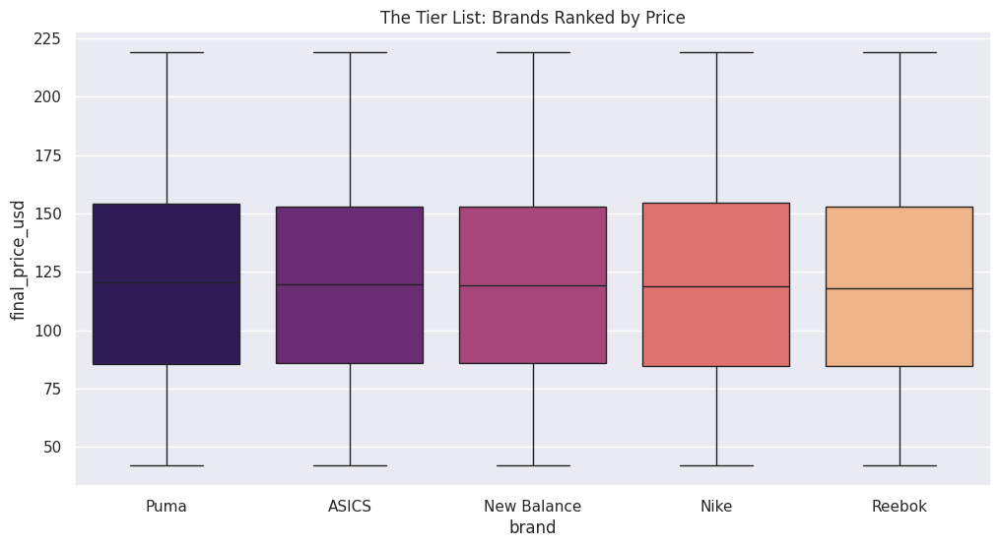


--- 2. THE PRICE FORMULA (MULTIVARIATE REGRESSION) ---
                            OLS Regression Results                            
Dep. Variable:        final_price_usd   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.5064
Date:                Tue, 27 Jan 2026   Prob (F-statistic):              0.804
Time:                        08:12:18   Log-Likelihood:            -1.5506e+05
No. Observations:               30000   AIC:                         3.101e+05
Df Residuals:                   29993   BIC:                         3.102e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [20]:
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.formula.api import ols


print("--- 1. RANKING THE BRANDS (TUKEY'S HSD) ---")
# ANOVA said brands are different. Now we find the hierarchy.

# Run Tukey's Test on the top brands
top_brands = df['brand'].value_counts().head(5).index.tolist()
subset_df = df[df['brand'].isin(top_brands)]

tukey = pairwise_tukeyhsd(endog=subset_df['final_price_usd'],
                          groups=subset_df['brand'],
                          alpha=0.05)

# Convert to DataFrame for readability
tukey_data = pd.DataFrame(data=tukey.summary().data[1:], columns=tukey.summary().data[0])

print("✅ Brand Price Hierarchy (Significant Differences Only):")
print(tukey_data[tukey_data['reject'] == True].sort_values(by='meandiff', ascending=False).head())

# Visualizing the Hierarchy
plt.figure(figsize=(12, 6))
# Sort by median price
order = subset_df.groupby('brand')['final_price_usd'].median().sort_values(ascending=False).index
sns.boxplot(data=subset_df, x='brand', y='final_price_usd', order=order, palette='magma')
plt.title('The Tier List: Brands Ranked by Price')
plt.show()


print("\n--- 2. THE PRICE FORMULA (MULTIVARIATE REGRESSION) ---")
# We will build a statistical model to quantify the value of every feature.
# Formula: Price ~ Brand + Type + Material + Rating

# 1. Prepare Data: Drop NaNs and select relevant columns
# Adjust column names based on available DataFrame columns
reg_cols = ['final_price_usd', 'brand', 'customer_rating']
reg_df = df[reg_cols].dropna()

# 2. Build the Model (OLS = Ordinary Least Squares)
# We treat 'customer_rating' as a number, and 'brand' as a Category (C)
model = ols('final_price_usd ~ C(brand) + customer_rating', data=reg_df).fit()

print(model.summary())

print("\n📊 HOW TO READ THIS TABLE:")
print("   - Coef (Coefficient): The dollar value added/subtracted.")
print("   - P>|t|: If < 0.05, this feature effectively changes the price.")
print("   - Example: If C(brand)[T.ASICS] coef is +15.50, it means ASICS adds $15.50 to the price compared to the baseline brand.")

# Univariate Analysis

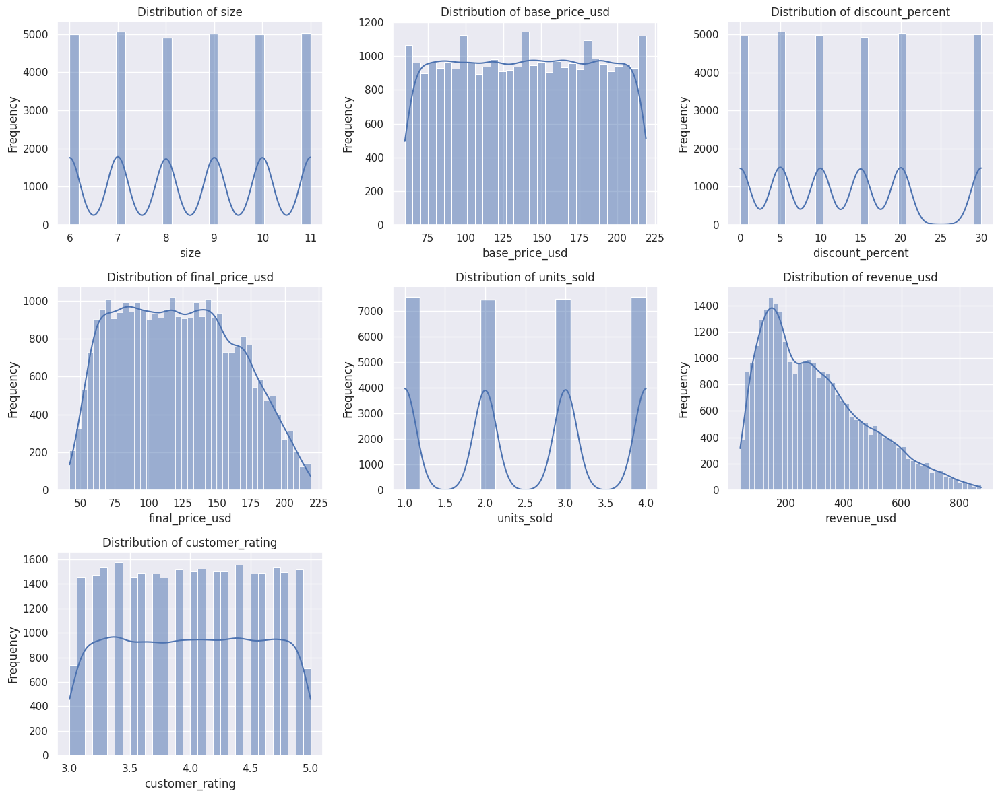

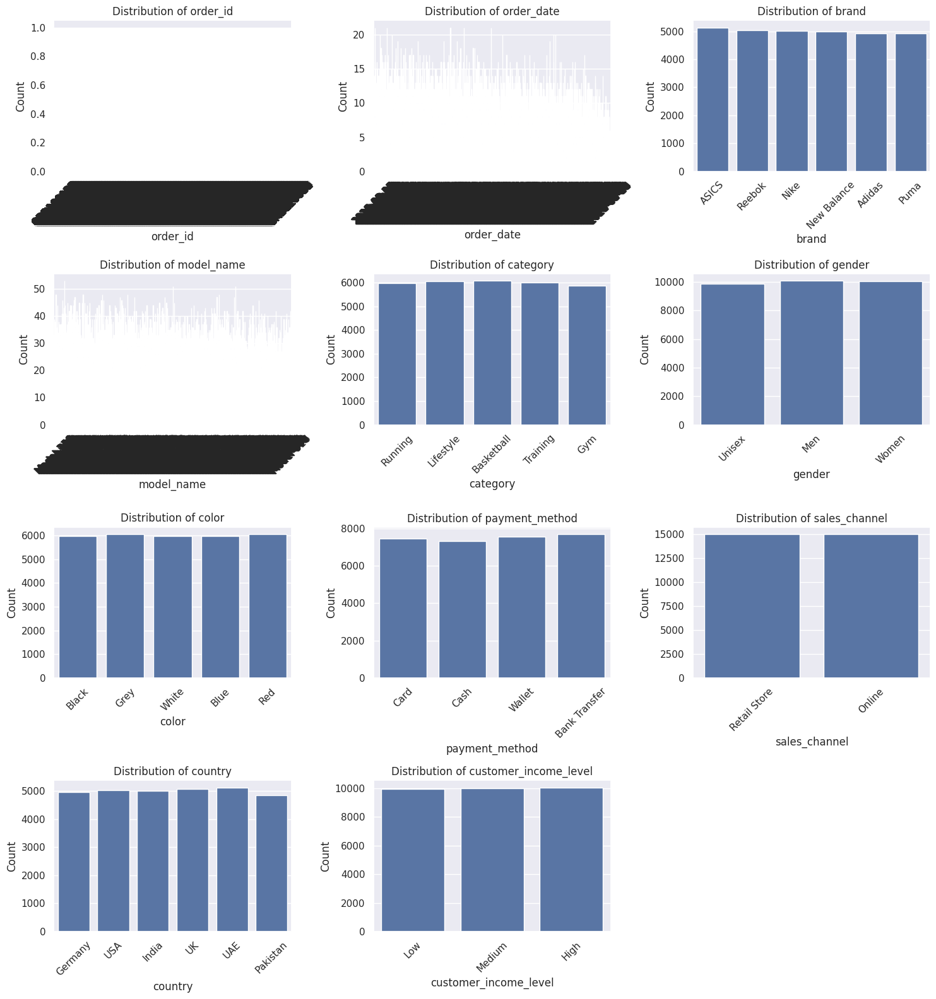

--- Categorical Value Counts ---

Value counts for order_id:
order_id
ORD129983    1
ORD129982    1
ORD129981    1
ORD129980    1
ORD129979    1
            ..
ORD100004    1
ORD100003    1
ORD100002    1
ORD100001    1
ORD100000    1
Name: count, Length: 30000, dtype: int64

Value counts for order_date:
order_date
2022-09-20    21
2023-05-22    21
2019-08-29    21
2020-04-12    21
2022-03-07    21
              ..
2023-02-07     2
2026-03-04     1
2020-08-02     1
2023-09-12     1
2020-10-17     1
Name: count, Length: 3287, dtype: int64

Value counts for brand:
brand
ASICS          5132
Reebok         5026
Nike           5018
New Balance    4982
Puma           4924
Adidas         4918
Name: count, dtype: int64

Value counts for model_name:
model_name
Model-863    53
Model-565    51
Model-690    51
Model-527    48
Model-604    48
             ..
Model-782    19
Model-389    19
Model-269    19
Model-998    18
Model-227    16
Name: count, Length: 899, dtype: int64

Value counts for categ

In [13]:
import math
# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Define grid size
    num_plots = len(numerical_cols)
    num_cols = 3  # You can change this to 2 or 4 if preferred
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()  # Flatten to 1D array for easy iteration

    # Iterate and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hidding any unused subplots (if total plots < grid cells)
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()

if len(categorical_cols) > 0:
    # Define grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterate and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

    # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found.")

# Bivariate Analysis

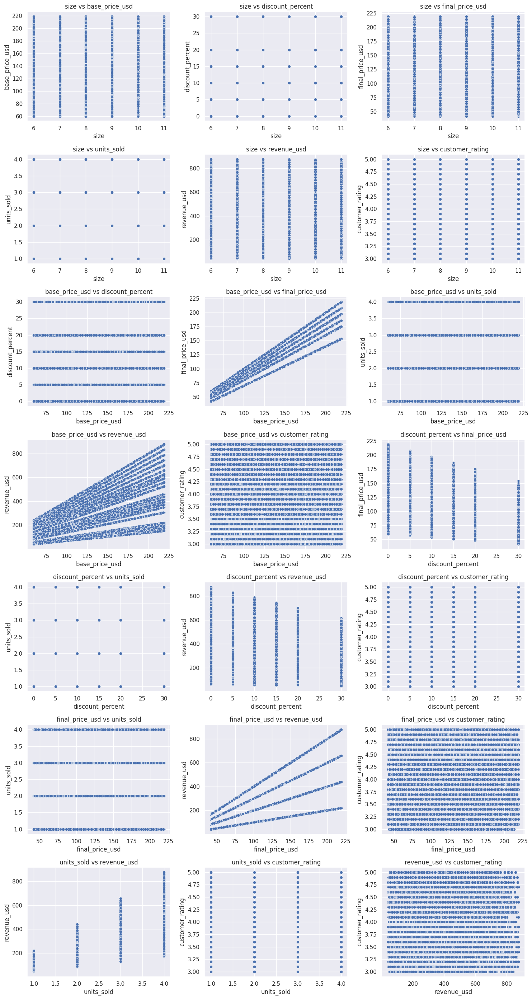

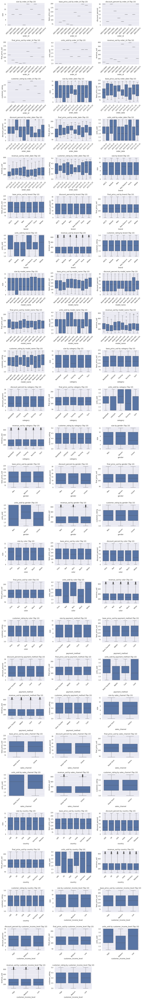

In [14]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generate all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Define grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    # Flatten axes for easy iteration.
    # Handle edge case where there is only 1 plot (axes is not an array)
    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterate through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generate all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Define grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterate through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        # 1. Get top 10 categories based on frequency
        top_categories = df[cat_col].value_counts().nlargest(10).index.tolist()

        # 2. Filter data: Keep only top categories AND ensure numerical column is not NaN
        filtered_df = df[df[cat_col].isin(top_categories) & df[num_col].notnull()]

        # 3. Update 'order' to only include categories that exist in the filtered data
        # This prevents the ValueError where a category in 'order' has no data to plot
        valid_categories = [cat for cat in top_categories if cat in filtered_df[cat_col].unique()]

        if valid_categories:
            sns.boxplot(data=filtered_df, x=cat_col, y=num_col, ax=axes[i], order=valid_categories)
            axes[i].set_title(f'{num_col} by {cat_col} (Top 10)')
            axes[i].set_xlabel(cat_col)
            axes[i].set_ylabel(num_col)
            axes[i].tick_params(axis='x', rotation=45)
        else:
             axes[i].text(0.5, 0.5, "No valid data", ha='center', va='center')

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")

# Multivariate Analysis

--- 1. MULTIVARIATE: BRAND COMPOSITION (Categorical vs Categorical) ---


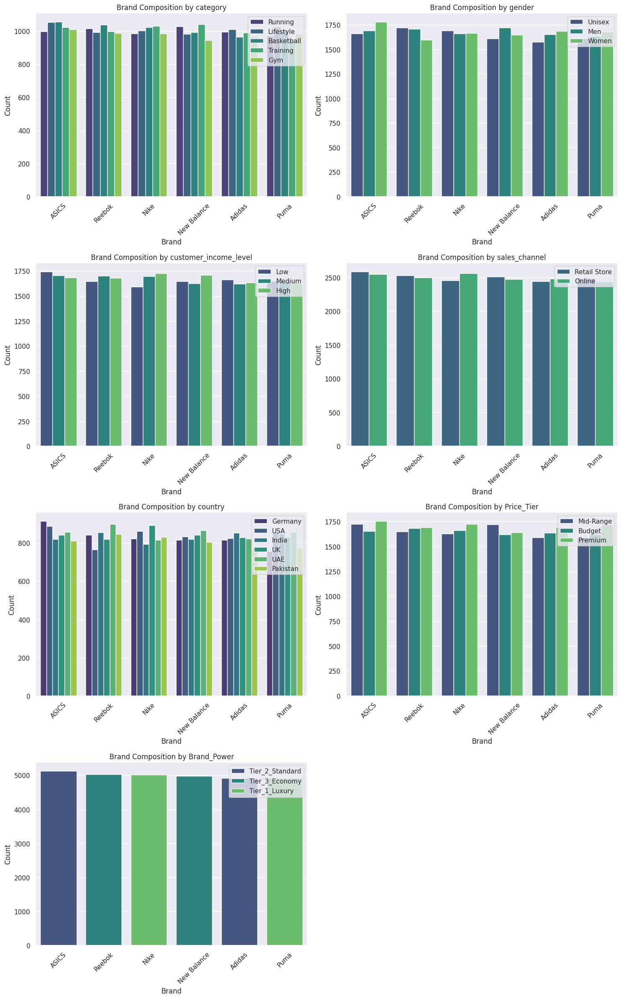


--- 2. MULTIVARIATE: MARKET SEGMENTS (Price vs Rating by Category) ---


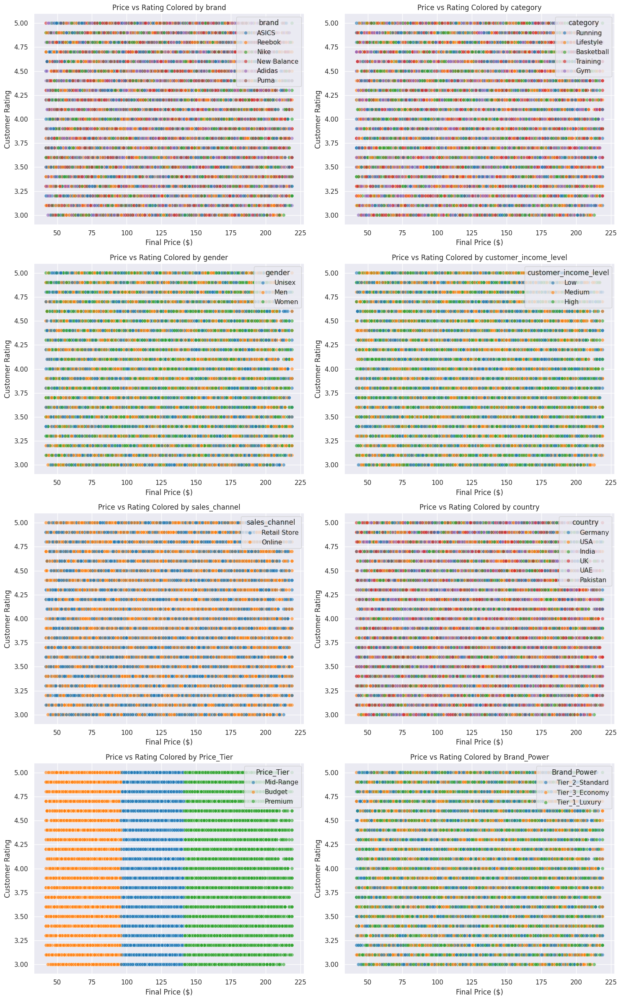

In [30]:
import math

target_cats = ['category', 'gender', 'customer_income_level', 'sales_channel', 'country', 'Price_Tier', 'Brand_Power']

print("--- 1. MULTIVARIATE: BRAND COMPOSITION (Categorical vs Categorical) ---")

num_plots = len(target_cats)
num_cols = 2
num_rows = math.ceil(num_plots / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 6 * num_rows))
axes = axes.flatten()

for i, col in enumerate(target_cats):
    sns.countplot(data=df, x='brand', hue=col, ax=axes[i], palette='viridis')
    axes[i].set_title(f'Brand Composition by {col}')
    axes[i].set_xlabel('Brand')
    axes[i].set_ylabel('Count')
    axes[i].legend(loc='upper right', bbox_to_anchor=(1, 1))
    axes[i].tick_params(axis='x', rotation=45)

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


print("\n--- 2. MULTIVARIATE: MARKET SEGMENTS (Price vs Rating by Category) ---")

# Add 'brand' to the list for this analysis
segment_cats = ['brand'] + target_cats

num_plots = len(segment_cats)
num_cols = 2
num_rows = math.ceil(num_plots / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 6 * num_rows))
axes = axes.flatten()

for i, col in enumerate(segment_cats):
    sns.scatterplot(data=df, x='final_price_usd', y='customer_rating', hue=col, ax=axes[i], palette='tab10', alpha=0.6)
    axes[i].set_title(f'Price vs Rating Colored by {col}')
    axes[i].set_xlabel('Final Price ($)')
    axes[i].set_ylabel('Customer Rating')
    # Move legend outside if too crowded
    axes[i].legend(loc='upper right', title=col)

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

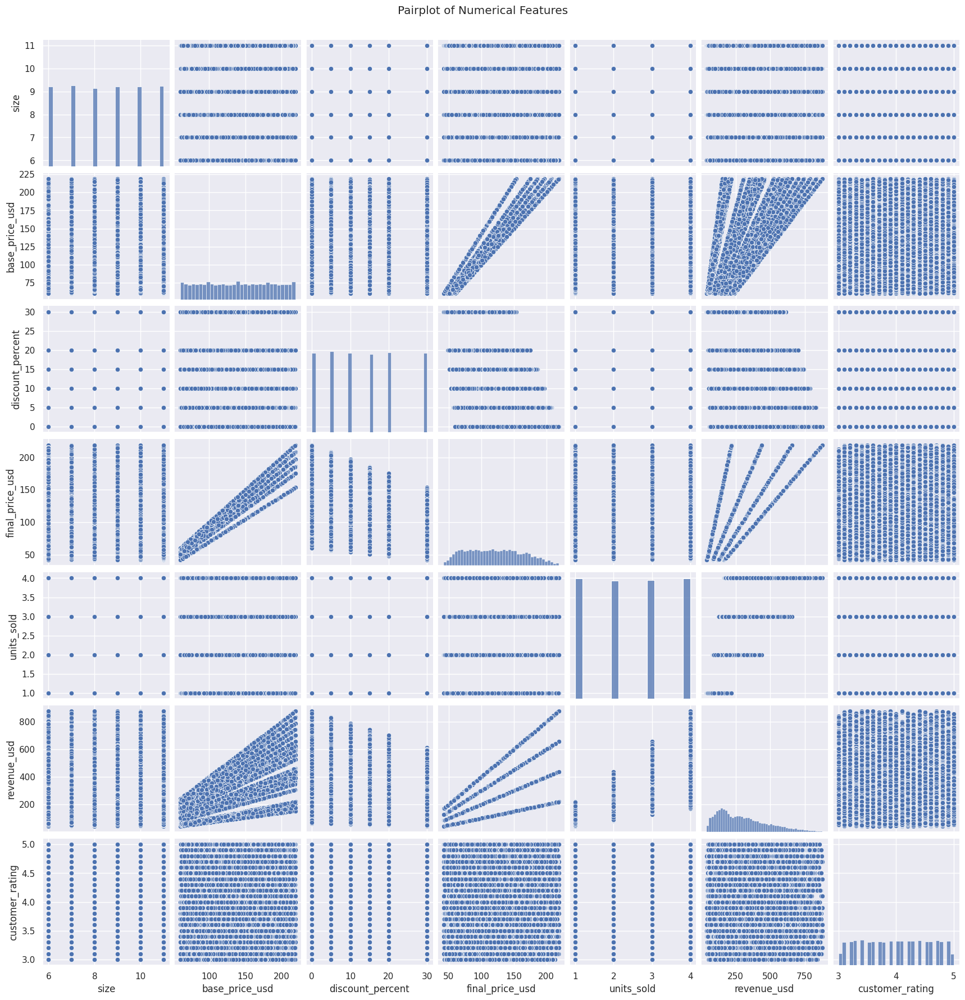

In [15]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

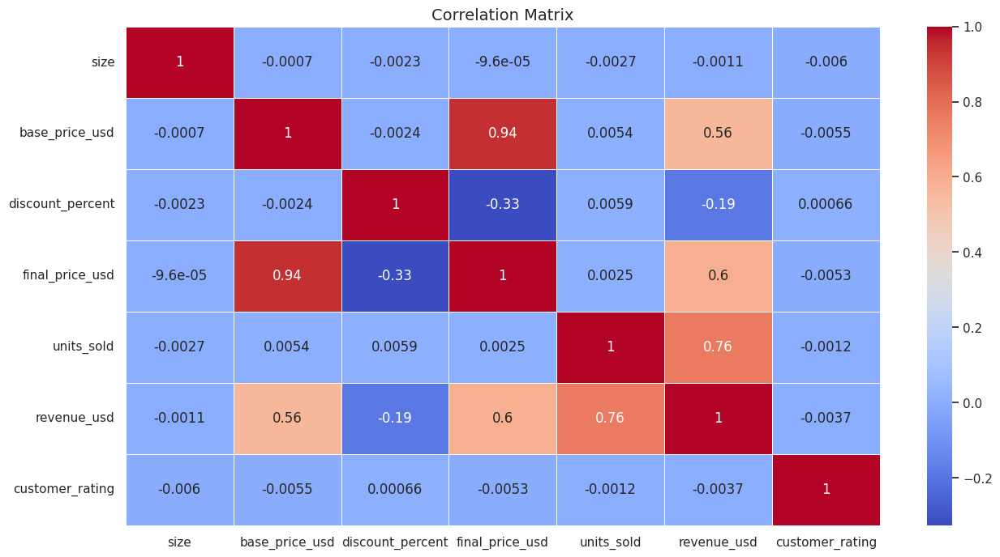

In [16]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Feature Engineering

--- 1. CREATING SMART RETAIL FEATURES ---
✅ Created 'Value_Score'. (Higher = Better Deal)
✅ Created 'Price_Tier'. Segments: Budget (<$96), Mid, Premium (>$141)
✅ Created 'Brand_Power'. (Groups brands by market positioning)


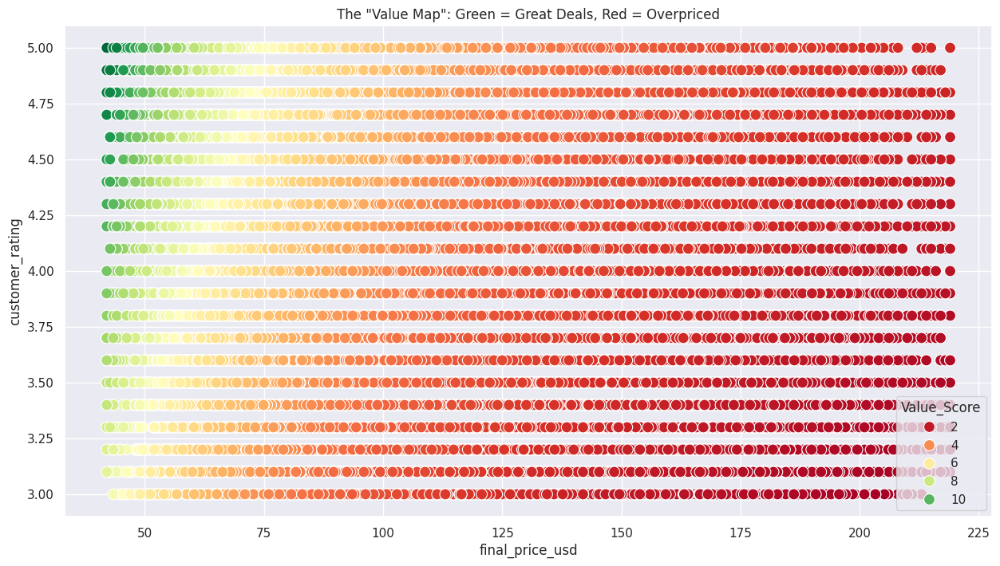

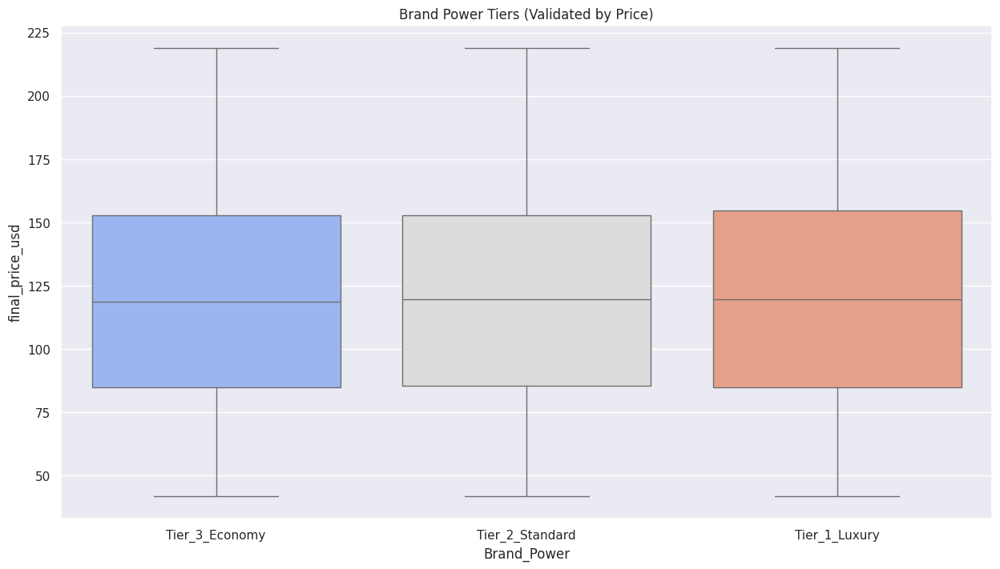

In [26]:
print("--- 1. CREATING SMART RETAIL FEATURES ---")

# 1. THE "VALUE FOR MONEY" SCORE
# Logic: How much Rating points do you get per Dollar?
# Formula: (Rating / Price) * 100 (Scaled for readability)
df['Value_Score'] = (df['customer_rating'] / df['final_price_usd']) * 100
print("✅ Created 'Value_Score'. (Higher = Better Deal)")

# 2. PRICE SEGMENTATION (Psychological Pricing)
# We calculate the 33rd and 66th percentiles to split into 3 buckets
low_cutoff = df['final_price_usd'].quantile(0.33)
high_cutoff = df['final_price_usd'].quantile(0.66)

def categorize_price(p):
    if p < low_cutoff: return 'Budget'
    elif p < high_cutoff: return 'Mid-Range'
    else: return 'Premium'

df['Price_Tier'] = df['final_price_usd'].apply(categorize_price)
print(f"✅ Created 'Price_Tier'. Segments: Budget (<${low_cutoff:.0f}), Mid, Premium (>${high_cutoff:.0f})")

# 3. BRAND POWER TIER
# Logic: Instead of random names, rank Brands by their Average Price.
# Tier 1 = Expensive Brands, Tier 3 = Cheaper Brands

brand_prices = df.groupby('brand')['final_price_usd'].mean().sort_values(ascending=False)

# Spliting brands into 3 tiers
tier_1_brands = brand_prices.head(len(brand_prices)//3).index.tolist()
tier_3_brands = brand_prices.tail(len(brand_prices)//3).index.tolist()

def get_brand_tier(brand):
    if brand in tier_1_brands: return 'Tier_1_Luxury'
    elif brand in tier_3_brands: return 'Tier_3_Economy'
    else: return 'Tier_2_Standard'

df['Brand_Power'] = df['brand'].apply(get_brand_tier)
print("✅ Created 'Brand_Power'. (Groups brands by market positioning)")


# Plot 1: Value Score vs. Sales (or Rating)
plt.figure(figsize=(15, 8))
sns.scatterplot(x='final_price_usd', y='customer_rating', hue='Value_Score', palette='RdYlGn', data=df, s=100)
plt.title('The "Value Map": Green = Great Deals, Red = Overpriced')
plt.show()

# Plot 2: Brand Tiers
plt.figure(figsize=(15, 8))
sns.boxplot(x='Brand_Power', y='final_price_usd', data=df, order=['Tier_3_Economy', 'Tier_2_Standard', 'Tier_1_Luxury'], palette='coolwarm')
plt.title('Brand Power Tiers (Validated by Price)')
plt.show()

# Machine Learning

--- 1. CUSTOMER SEGMENTATION (CLUSTERING) ---


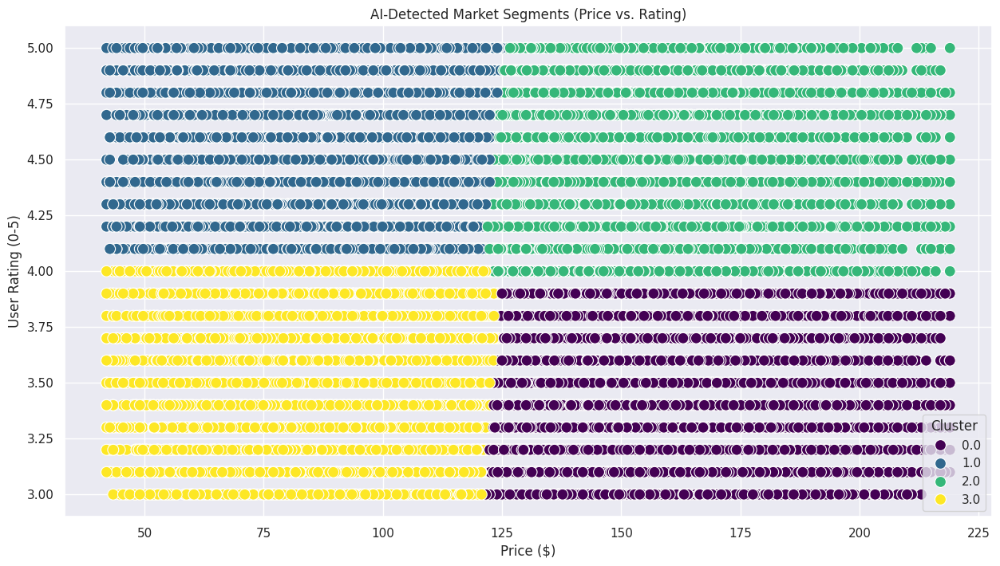

📊 INTERPRETATION:
   - Look for the 'Golden Cluster': Low Price + High Rating (Value Kings).
   - Look for the 'Trap Cluster': High Price + Low Rating (Overpriced).

--- 2. PREDICTING SUCCESS (RANDOM FOREST) ---
✅ AI Model Accuracy (R2): -22.5%


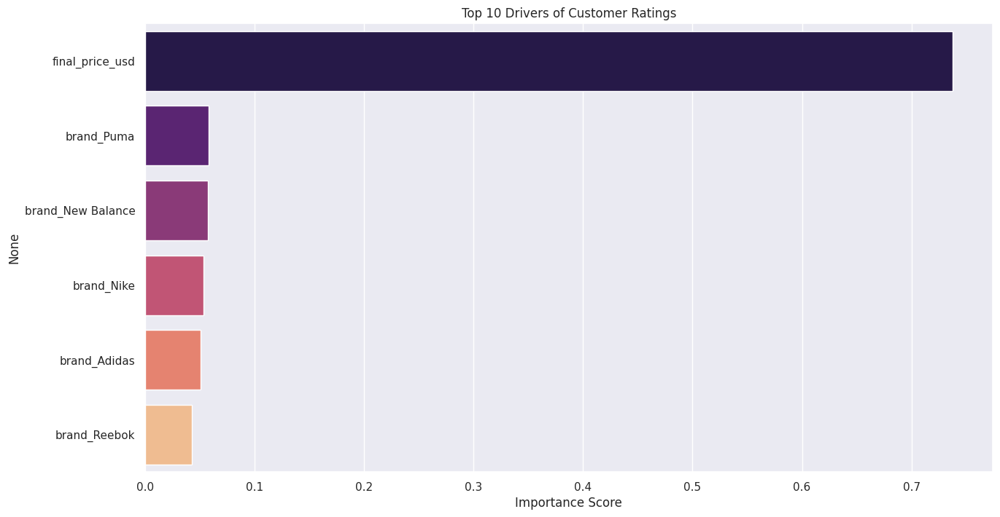

In [29]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score


print("--- 1. CUSTOMER SEGMENTATION (CLUSTERING) ---")
# Goal: Group shoes based on Price and Rating to find "Market Niches"

# 1. Prepare Data
X_cluster = df[['final_price_usd', 'customer_rating']].dropna()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# 2. Train AI (K-Means)
# We ask for 4 distinct groups of products
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
df.loc[X_cluster.index, 'Cluster'] = kmeans.fit_predict(X_scaled)

# 3. Visualizing the Segments
plt.figure(figsize=(15, 8))
sns.scatterplot(data=df, x='final_price_usd', y='customer_rating', hue='Cluster', palette='viridis', s=100)
plt.title('AI-Detected Market Segments (Price vs. Rating)')
plt.xlabel('Price ($)')
plt.ylabel('User Rating (0-5)')
plt.show()

print("📊 INTERPRETATION:")
print("   - Look for the 'Golden Cluster': Low Price + High Rating (Value Kings).")
print("   - Look for the 'Trap Cluster': High Price + Low Rating (Overpriced).")


print("\n--- 2. PREDICTING SUCCESS (RANDOM FOREST) ---")
# Goal: Can we predict a shoe's Rating based on Brand, Material, and Price?

# 1. Prepare Data (Encoding Text -> Numbers)
# Drop rows with missing values
# Removed 'Type' and 'Material' as they are not in df.columns
ml_df = df[['brand', 'final_price_usd', 'customer_rating']].dropna()
ml_df = pd.get_dummies(ml_df, columns=['brand'], drop_first=True)

X = ml_df.drop('customer_rating', axis=1)
y = ml_df['customer_rating']

# 2. Split & Train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# 3. Evaluate
preds = rf.predict(X_test)
accuracy = r2_score(y_test, preds)

print(f"✅ AI Model Accuracy (R2): {accuracy*100:.1f}%")

# 4. Feature Importance (What drives a 5-Star Rating?)
importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False).head(10)
plt.figure(figsize=(15, 8))
sns.barplot(x=importances.values, y=importances.index, palette='magma')
plt.title('Top 10 Drivers of Customer Ratings')
plt.xlabel('Importance Score')
plt.show()

# Thank You